In [1]:
import matplotlib.pyplot as plt
import tifffile
import cv2
import numpy as np
import json
import os

In [2]:
image = tifffile.imread("S120201001 (3).tif")


In [3]:
metadata = tifffile.TiffFile("S120201001 (3).tif")

In [4]:
metadata.pages[0]

In [5]:
type(image)

numpy.ndarray

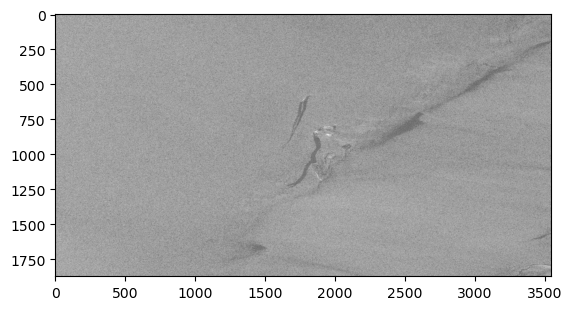

In [6]:
plt.imshow(image, cmap='gray')

In [7]:
image.shape

(1873, 3548)

In [8]:
plt.imsave('image_sentinel.png', image, cmap='gray')

In [9]:
# 3690x4802 -> 1250x650 n patches

# Create patches

In [7]:
# sliding window
def create_patch(img, overlap, patch_size):
    patches = []
    for y in range(0, img.shape[0], int(patch_size[0]*overlap)):
        for x in range(0, img.shape[1], int(patch_size[1]*overlap)):
            patch = img[y:y+patch_size[0], x:x+patch_size[1]]
            if patch.shape[1] < patch_size[1] and patch.shape[0] == patch_size[0]:
                patch = img[y:y+patch_size[0], img.shape[1]-patch_size[1]:img.shape[1]]
            elif patch.shape[0] < patch_size[0] and patch.shape[1] == patch_size[1]:
                patch = img[img.shape[0]-patch_size[0]:img.shape[0], x:x+patch_size[1]]
            elif patch.shape[0] < patch_size[0] and patch.shape[1] < patch_size[1]:
                patch = img[img.shape[0]-patch_size[0]:img.shape[0], img.shape[1]-patch_size[1]:img.shape[1]]
            patches.append(patch)
    return patches

In [8]:
def smooth(img):
    img = cv2.medianBlur(img, 3)
    return img    

In [12]:
img = cv2.imread('image_sentinel.png')

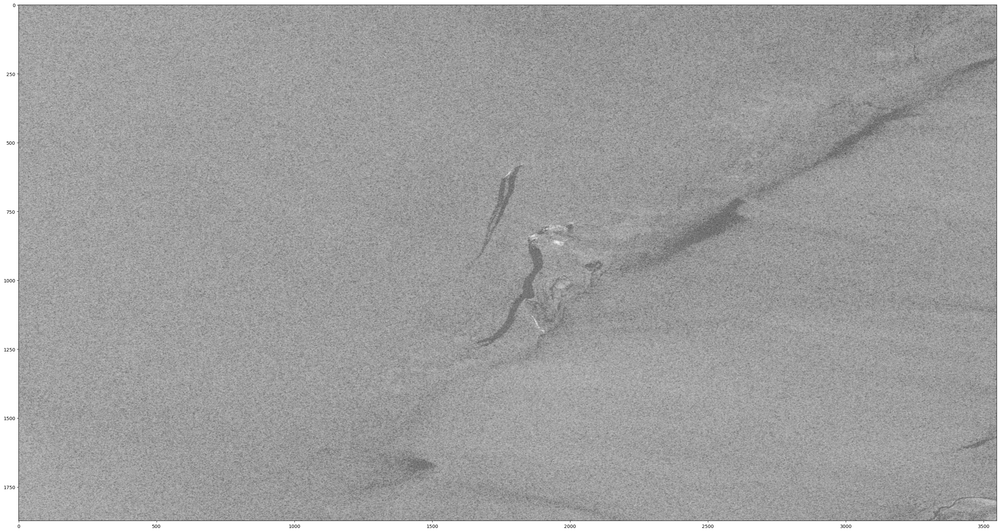

In [13]:
plt.figure(figsize=(500, 20))
plt.imshow(img)

In [14]:
image_gray = img[:, :, 0]
image_gray = smooth(image_gray)

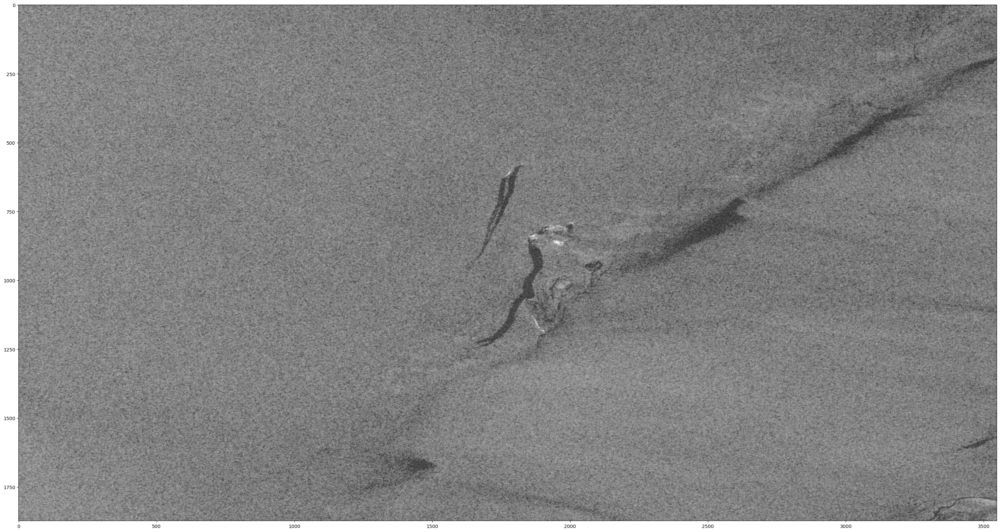

In [15]:
plt.figure(figsize=(500, 20))
plt.imshow(image_gray, cmap='gray')

In [16]:
image_gray.shape

(1873, 3548)

In [17]:
ptchs = create_patch(image_gray, 0.8, (650, 1250))

In [18]:
len(ptchs)

16

In [19]:
for idx, k in enumerate(ptchs):
    cv2.imwrite(f'patches/train/{idx}.png', k)

In [20]:
# 1250 > patch_size*0.6, 0 > 0+640*0.8

# Create Mask. Labelme

In [8]:
def fill_mask(pth):
    annot = open(pth)
    
    annot_json = json.load(annot)
    
    width = annot_json['imageWidth']
    height = annot_json['imageHeight']
    
    mask = np.zeros((height, width), dtype=np.uint8)
    print(len(annot_json['shapes']))
    for idx in range(len(annot_json['shapes'])):
        vertices = np.array(annot_json['shapes'][idx]['points'], np.int32)
        cv2.fillPoly(mask, [vertices], 255)
    return mask

In [13]:
msk = fill_mask('image_sentinel.json')

15


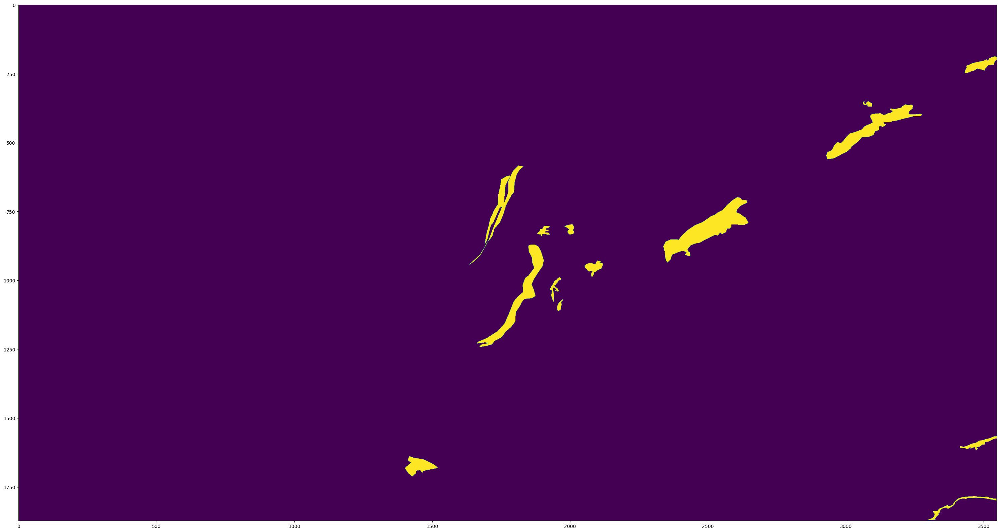

In [14]:
plt.figure(figsize=(500, 20))
plt.imshow(msk)

In [32]:
msk.shape

(1873, 3548)

In [25]:
np.unique(msk)

array([  0, 255], dtype=uint8)

In [26]:
#msk[msk==255]=1

In [27]:
np.unique(msk)

array([  0, 255], dtype=uint8)

In [28]:
msks = create_patch(msk, 0.8, (650, 1250))

In [29]:
len(msks)

16

In [30]:
for idx, k in enumerate(msks):
    cv2.imwrite(f'mask/{idx}.png', k)


In [31]:
#"CustomDataset"
    #Images 
        #ImageID1 - 0001
            #0.png
            #1.png
            #2.png
        #ImageID2 - 0002
            #0.png
            #1.png
            #2.png
            #3.png
    #Masks
        #ImageID1
            #0.png
            #1.png
        #ImageID2
            #0.png
            #1.png